# Gyro Predictor — Clean Pipeline
Runs load → calibrate → segment → split → normalize → train CNN/LSTM/Transformer → classic baselines → evaluate/compare → visualize.

In [1]:
from pathlib import Path
import json, os, numpy as np, torch
from gyro_predictor.config import Config
from gyro_predictor.utils.seed import set_seed
from gyro_predictor.utils.device import get_device
from gyro_predictor.utils.paths import ensure_dir

cfg = Config(
    use_acc=True,
)

set_seed(cfg.seed)
device = get_device()
device

device(type='cuda')

In [2]:
from gyro_predictor.train.data_utils import collect_segments, split_segments
all_segments = {}
for hz in cfg.hz_list:
    print(f"Collecting & segmenting {hz}Hz...")
    segs = collect_segments(cfg.data_root, hz, cfg.use_acc, cfg.skip_uncalibrated, cfg.jump_factor, cfg.min_segment_len)
    print(f"  => {len(segs)} usable segments")
    all_segments[hz] = segs
all_segments.keys()

[calib] 10MinStatic.csv: |Sg|=0.000529025 |bg|=70.3409 |Sa|=0.00206522 |ba|=30.2906
[ok]  10MinStatic.csv: raw_g0=(-311.00,-958.00,1205.00) -> cal_g0=(-0.110806,-0.299431,0.380885)
[calib] 25MinStatic.csv: |Sg|=0.000529025 |bg|=84.1598 |Sa|=0.00206471 |ba|=54.4773
[ok]  25MinStatic.csv: raw_g0=(-335.00,-966.00,1191.00) -> cal_g0=(-0.120244,-0.304065,0.379839)
[calib] 25MinStaticNoTemp.csv: |Sg|=0.000529025 |bg|=84.1598 |Sa|=0.00206471 |ba|=54.4773
[ok]  25MinStaticNoTemp.csv: raw_g0=(61.00,30.00,-61.00) -> cal_g0=(0.000707,0.000147,-0.002563)
[calib] AlexParkingLotAfterCar.csv: |Sg|=0.000529025 |bg|=33.7127 |Sa|=0.00207357 |ba|=85.2078
[ok]  AlexParkingLotAfterCar.csv: raw_g0=(-573.00,-341.00,984.00) -> cal_g0=(-0.180728,-0.102074,0.308856)
[calib] BiasLearning.csv: |Sg|=0.000529025 |bg|=84.1598 |Sa|=0.00206471 |ba|=54.4773
[ok]  BiasLearning.csv: raw_g0=(-320.00,-962.00,1143.00) -> cal_g0=(-0.115663,-0.302843,0.365178)
[calib] CalibOverrideTest.csv: |Sg|=0.000529025 |bg|=84.1598 |Sa|=

dict_keys([52, 104])

In [3]:
from pathlib import Path
from gyro_predictor.train.data_utils import split_segments_cached 

splits = {}
for hz, segs in all_segments.items():
    cache = Path(cfg.artifacts) / "splits" / f"{hz}Hz.json"
    tr, va, te = split_segments_cached(
        segs,
        ratios=cfg.split_ratios,
        seed=cfg.seed,
        cache_file=cache,
        force_resplit=getattr(cfg, "force_resplit", False),         # optional; defaults to False if missing
    )
    splits[hz] = (tr, va, te)
    print(f"{hz}Hz: train {len(tr)}, val {len(va)}, test {len(te)}")
list(splits.keys())


[split-cache] loaded 52Hz.json: 275/58/60 (n=393)
52Hz: train 275, val 58, test 60
[split-cache] loaded 104Hz.json: 3302/707/709 (n=4718)
104Hz: train 3302, val 707, test 709


[52, 104]

In [4]:
# Sanity plots: dt histogram, per-channel distributions, and a quick segment preview
import numpy as np
import matplotlib.pyplot as plt
from gyro_predictor.data.segment import expected_dt_us

def plot_dt_hist(timestamps_us, hz, jump_factor=1.5):
    ts = np.asarray(timestamps_us, dtype=np.int64)
    if len(ts) < 2:
        print("Not enough samples to plot dt histogram.")
        return None
    dt = np.diff(ts)
    exp = expected_dt_us(hz)
    fig, ax = plt.subplots(figsize=(8,4))
    ax.hist(dt, bins=100)
    ax.axvline(exp, linestyle="--", label=f"expected={exp}us")
    ax.axvline(jump_factor*exp, linestyle="--", label=f"jump_thr={int(jump_factor*exp)}us")
    ax.set_title(f"Δt histogram @ {hz}Hz")
    ax.set_xlabel("microseconds"); ax.set_ylabel("count"); ax.legend()
    fig.tight_layout(); return fig

def plot_channel_hist(df, title=None):
    fig, axs = plt.subplots(2, 3, figsize=(12,6))
    cols = ["gx","gy","gz","ax","ay","az"]
    for i,c in enumerate(cols):
        r, k = divmod(i,3)
        axs[r,k].hist(df[c].values, bins=100)
        axs[r,k].set_title(c)
    if title: fig.suptitle(title)
    fig.tight_layout(); return fig

def plot_segment_preview(df, n_points=1000, title=None):
    T = min(len(df), n_points)
    t = np.arange(T)
    fig, axs = plt.subplots(2,1, figsize=(12,6), sharex=True)
    axs[0].plot(t, df["gx"].values[:T], label="gx")
    axs[0].plot(t, df["gy"].values[:T], label="gy")
    axs[0].plot(t, df["gz"].values[:T], label="gz")
    axs[0].legend(); axs[0].set_ylabel("gyro (rad/s)")
    axs[1].plot(t, df["ax"].values[:T], label="ax")
    axs[1].plot(t, df["ay"].values[:T], label="ay")
    axs[1].plot(t, df["az"].values[:T], label="az")
    axs[1].legend(); axs[1].set_ylabel("acc (m/s^2)")
    axs[1].set_xlabel("sample")
    if title: axs[0].set_title(title)
    fig.tight_layout(); return fig


=== 52Hz sanity ===


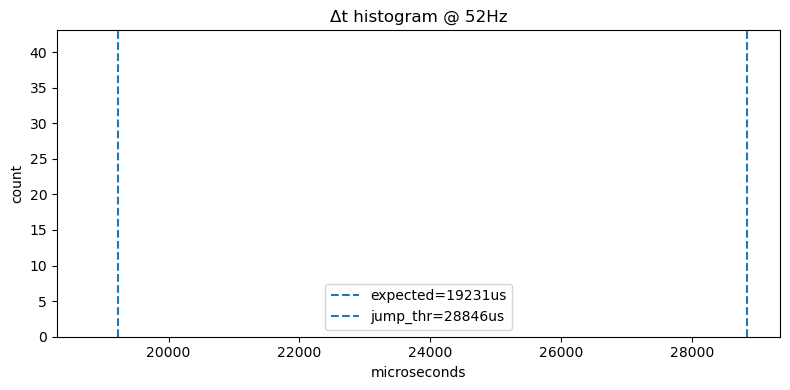

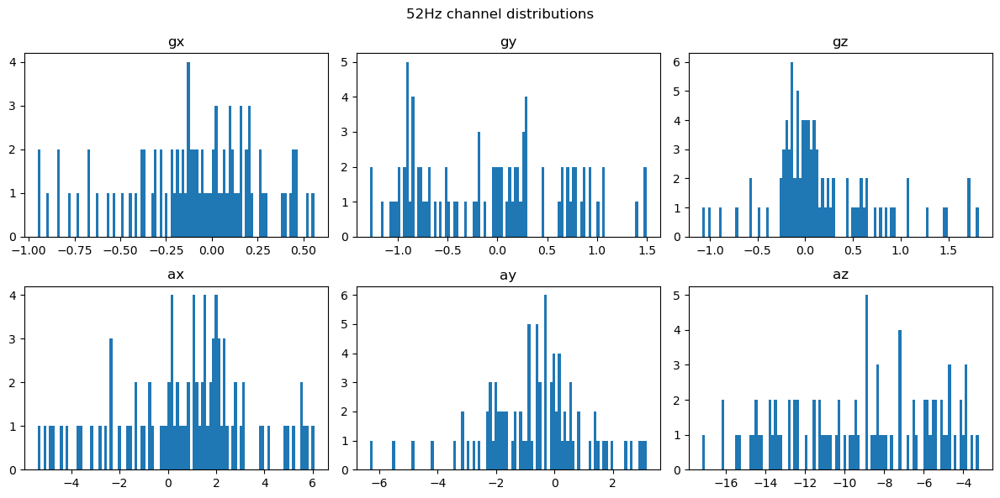

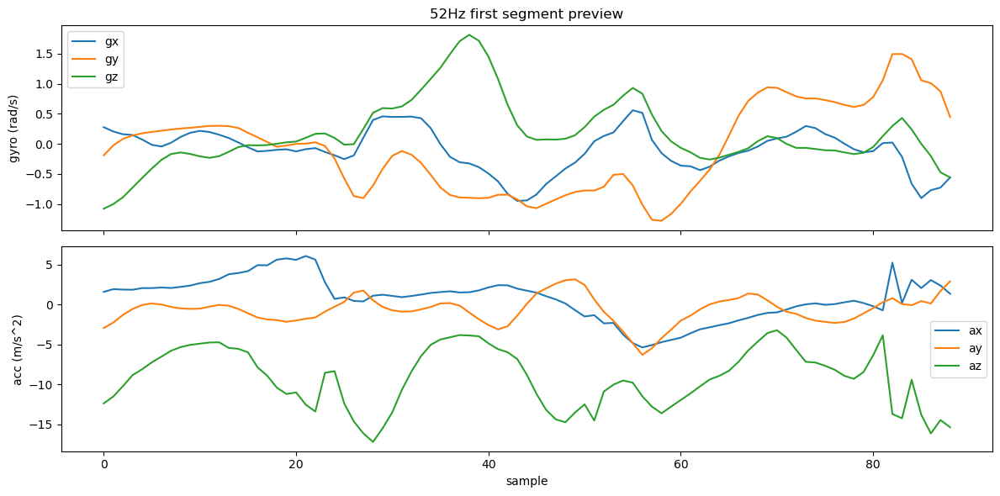


=== 104Hz sanity ===


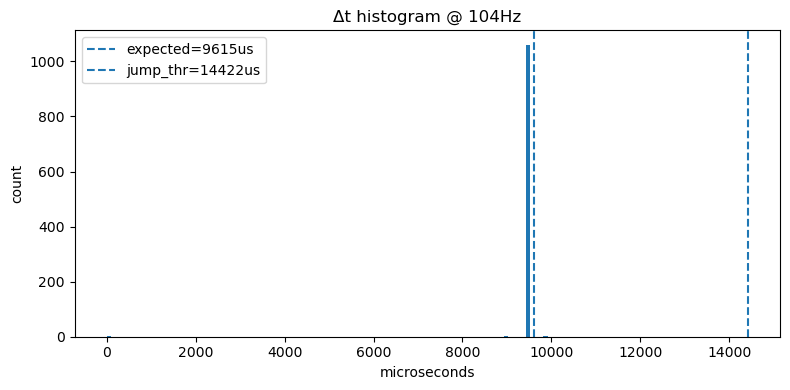

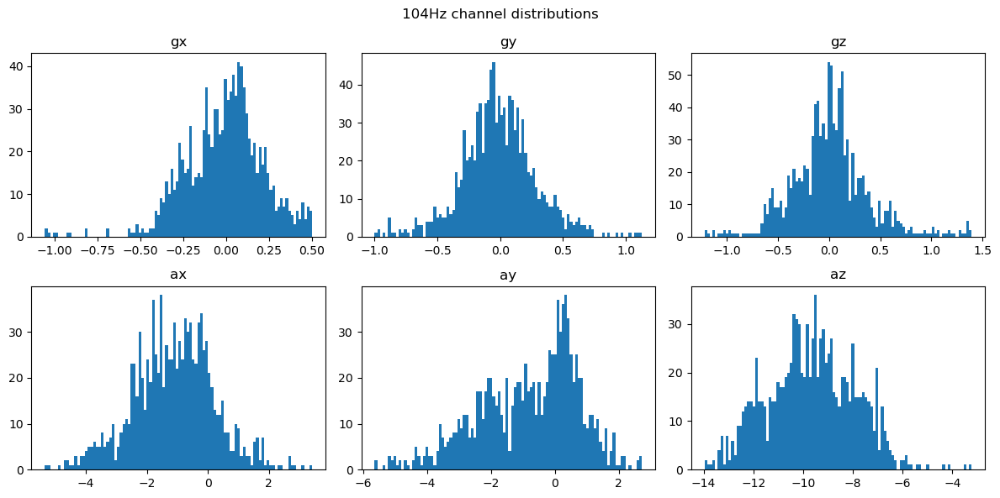

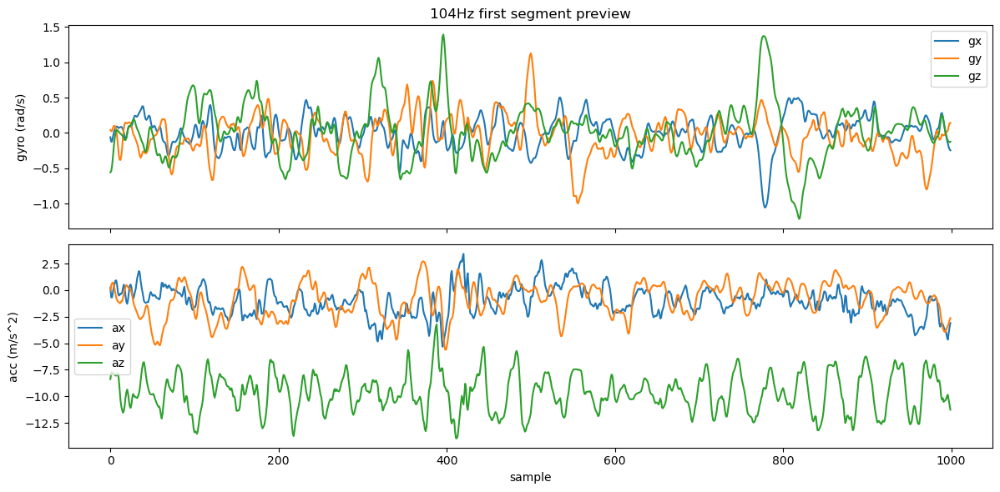

In [5]:
# Pick a couple of segments from each Hz and plot sanity checks
for hz, (tr, va, te) in splits.items():
    try:
        sample_seg = (tr or va or te)[0]
    except Exception:
        print(f"{hz}Hz: no segments available for sanity plots")
        continue

    print(f"\n=== {hz}Hz sanity ===")
    _ = plot_dt_hist(sample_seg["timestamp"].values, hz, jump_factor=cfg.jump_factor); plt.show()
    _ = plot_channel_hist(sample_seg, title=f"{hz}Hz channel distributions"); plt.show()
    _ = plot_segment_preview(sample_seg, title=f"{hz}Hz first segment preview"); plt.show()

In [6]:
import json, time
import numpy as np, torch
from gyro_predictor.train.data_utils import make_datasets
from gyro_predictor.train.factory import build_model
from gyro_predictor.train.trainer import train_model, evaluate
from gyro_predictor.utils.paths import artifact_path

results = {}
ARCHS = ["cnn", "lstm", "transformer"]

for hz in cfg.hz_list:
    tr, va, te = splits[hz]
    for k in cfg.horizons:
        H = cfg.history_map[k]
        train_ds, val_ds, test_ds, stdz = make_datasets(tr, va, te, history=H, k=k, use_acc=cfg.use_acc)
        in_ch = train_ds.X.shape[-1] if len(train_ds) > 0 else (6 if cfg.use_acc else 3)

        for arch in ARCHS:
            base = artifact_path(cfg.artifacts, hz, arch, k, H, "model.pt")
            base.parent.mkdir(parents=True, exist_ok=True)
            metrics_path = base.parent / "metrics.json"
            pred_path    = base.parent / "pred.npy"
            true_path    = base.parent / "true.npy"
            meta_path    = base.parent / "meta.json"

            # -------- load or train --------
            if base.exists() and not cfg.retrain:
                print(f"[skip train] Using existing weights: {base}")

                try:
                    obj = torch.load(base, map_location=device, weights_only=True)  # safe path (torch>=2.4)
                except TypeError:
                    obj = torch.load(base, map_location=device)  # older torch fallback

                meta = json.loads(meta_path.read_text()) if meta_path.exists() else {}

                # Normalize to (state_dict, in_ch_saved)
                if isinstance(obj, dict) and "state_dict" in obj:
                    # Legacy checkpoint: a pickled dict that contains a state_dict
                    legacy = obj
                    state_dict = legacy["state_dict"]
                    in_ch_saved = int(legacy.get("in_ch", meta.get("in_ch", in_ch)))

                    # Re-save in safe weights-only format + sidecar meta
                    torch.save(state_dict, base)  # tensors only
                    meta.update({"in_ch": in_ch_saved, "history": int(H), "k": int(k), "arch": arch, "hz": int(hz)})
                    meta_path.write_text(json.dumps(meta, indent=2))
                    print("[compat] Re-saved checkpoint in safe weights-only format.")
                else:
                    # weights_only=True typically returns a plain state_dict (mapping of name -> Tensor)
                    state_dict = obj
                    in_ch_saved = int(meta.get("in_ch", in_ch))

                # Build + load
                model = build_model(arch, in_ch=in_ch_saved)
                model.load_state_dict(state_dict)

            else:
                print(f"=== {hz}Hz | {arch} | k={k} | H={H} ===")
                model = build_model(arch, in_ch=in_ch)

                model, hist = train_model(
                    model, train_ds, val_ds, device,
                    epochs=cfg.epochs,
                    batch_size=cfg.batch_size,
                    lr=cfg.lr,
                    weight_decay=cfg.weight_decay,
                    early_patience=cfg.early_patience,
                    use_amp=True,
                    # workers
                    num_workers=cfg.num_workers,
                    persistent_workers=cfg.persistent_workers,
                    prefetch_factor=cfg.prefetch_factor,
                    pin_memory=cfg.pin_memory,
                    seed=getattr(cfg, "seed", 42),
                )

                # NEW: save **weights only**
                torch.save(model.state_dict(), base)  # tensors only

                # NEW: save metadata separately
                meta = {"in_ch": int(in_ch), "history": int(H), "k": int(k), "arch": arch, "hz": int(hz)}
                meta_path.write_text(json.dumps(meta, indent=2))

                (base.parent / "history.json").write_text(json.dumps(hist, indent=2))

            # -------- reuse or evaluate --------
            if (not cfg.retrain) and metrics_path.exists() and pred_path.exists() and true_path.exists():
                print(f"[skip eval] Using cached predictions/metrics in {base.parent}")
                metrics = json.loads(metrics_path.read_text())
                pred = torch.from_numpy(np.load(pred_path))
                true = torch.from_numpy(np.load(true_path))
            else:
                metrics, pred, true = evaluate(
                    model, test_ds, device, measure_latency=True,
                    # workers
                    num_workers=cfg.num_workers,
                    persistent_workers=cfg.persistent_workers,
                    prefetch_factor=cfg.prefetch_factor,
                    pin_memory=cfg.pin_memory,
                    seed=getattr(cfg, "seed", 42),
                )
                metrics_path.write_text(json.dumps(metrics, indent=2))
                np.save(pred_path, pred.numpy())
                np.save(true_path, true.numpy())

            results[(hz, arch, k)] = metrics

print("Done.")

[skip train] Using existing weights: artifacts\52Hz\cnn\k1_h8\model.pt
[skip eval] Using cached predictions/metrics in artifacts\52Hz\cnn\k1_h8
[skip train] Using existing weights: artifacts\52Hz\lstm\k1_h8\model.pt
[skip eval] Using cached predictions/metrics in artifacts\52Hz\lstm\k1_h8
[skip train] Using existing weights: artifacts\52Hz\transformer\k1_h8\model.pt
[skip eval] Using cached predictions/metrics in artifacts\52Hz\transformer\k1_h8
[skip train] Using existing weights: artifacts\52Hz\cnn\k2_h10\model.pt
[skip eval] Using cached predictions/metrics in artifacts\52Hz\cnn\k2_h10
[skip train] Using existing weights: artifacts\52Hz\lstm\k2_h10\model.pt
[skip eval] Using cached predictions/metrics in artifacts\52Hz\lstm\k2_h10
[skip train] Using existing weights: artifacts\52Hz\transformer\k2_h10\model.pt
[skip eval] Using cached predictions/metrics in artifacts\52Hz\transformer\k2_h10
[skip train] Using existing weights: artifacts\52Hz\cnn\k3_h10\model.pt
[skip eval] Using cach

In [7]:
from gyro_predictor.classic.baseline_runner import run_rls_baselines, RLSConfig

rls_cfg = RLSConfig(
    a=0.99,
    e=1e-2,
    N=10,
    use_numba=True,
    max_workers=8,           # or None to auto-pick
    show_algo_inner_bars=False,
    retrain_override=False  # set True to force recompute
)

baselines = run_rls_baselines(cfg, splits, rls_cfg)

[baseline cache] RLS 52Hz k=1 | T=66714 out_len=66713


Baselines (RLS + RLSLpos): 100%|██████████| 8/8 [00:00<00:00, 841.34it/s]

[baseline cache] RLS 52Hz k=3 | T=66714 out_len=66711
[baseline cache] RLS 104Hz k=1 | T=604339 out_len=604338
[baseline cache] RLS 52Hz k=2 | T=66714 out_len=66712
[baseline cache] RLS 104Hz k=2 | T=604339 out_len=604337
[baseline cache] RLS 52Hz k=4 | T=66714 out_len=66710
[baseline cache] RLS 104Hz k=3 | T=604339 out_len=604336
[baseline cache] RLS 104Hz k=4 | T=604339 out_len=604335
[baseline cache] RLSLpos 52Hz k=1 | T=66714 out_len=66713
[baseline cache] RLSLpos 52Hz k=3 | T=66714 out_len=66711
[baseline cache] RLSLpos 104Hz k=1 | T=604339 out_len=604338
[baseline cache] RLSLpos 52Hz k=2 | T=66714 out_len=66712
[baseline cache] RLSLpos 104Hz k=2 | T=604339 out_len=604337
[baseline cache] RLSLpos 52Hz k=4 | T=66714 out_len=66710
[baseline cache] RLSLpos 104Hz k=3 | T=604339 out_len=604336
[baseline cache] RLSLpos 104Hz k=4 | T=604339 out_len=604335
[done] Baselines ready & cached.


[summary] rows=40 saved -> artifacts\summaries\metrics_latency_params.csv


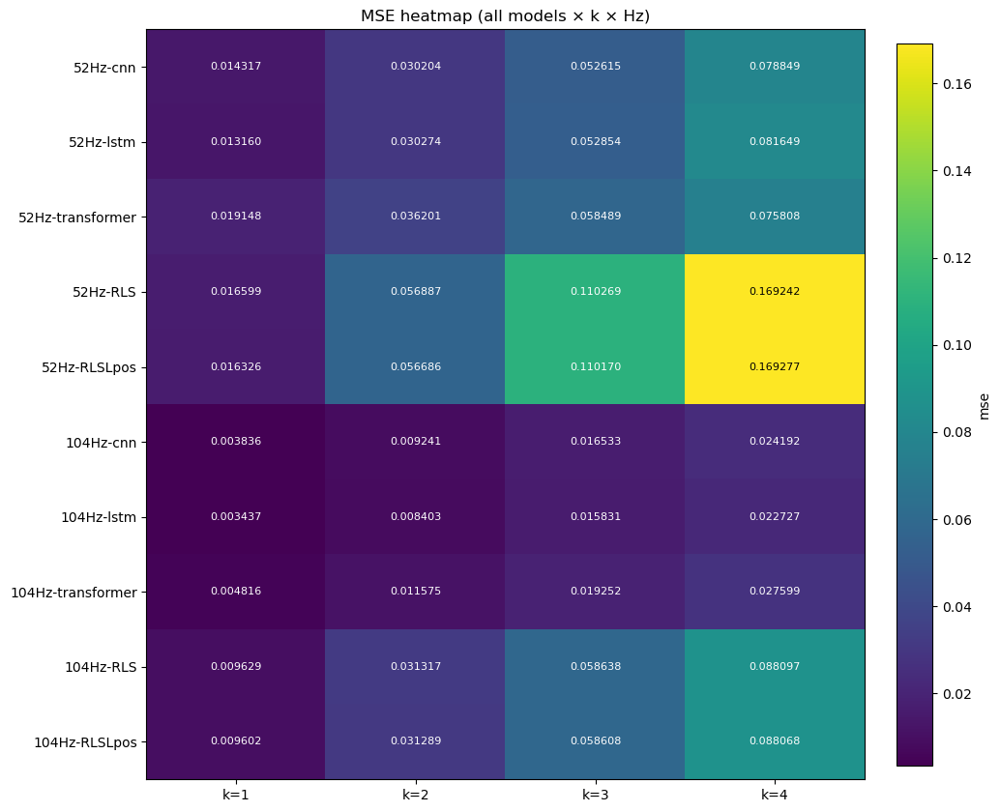

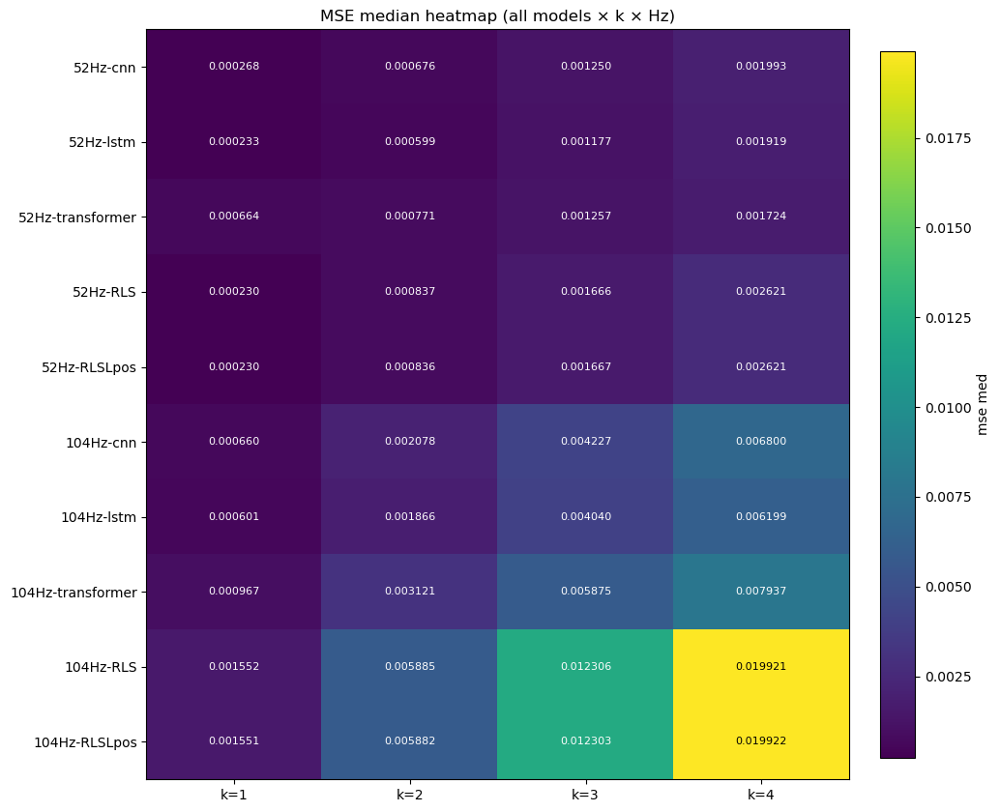

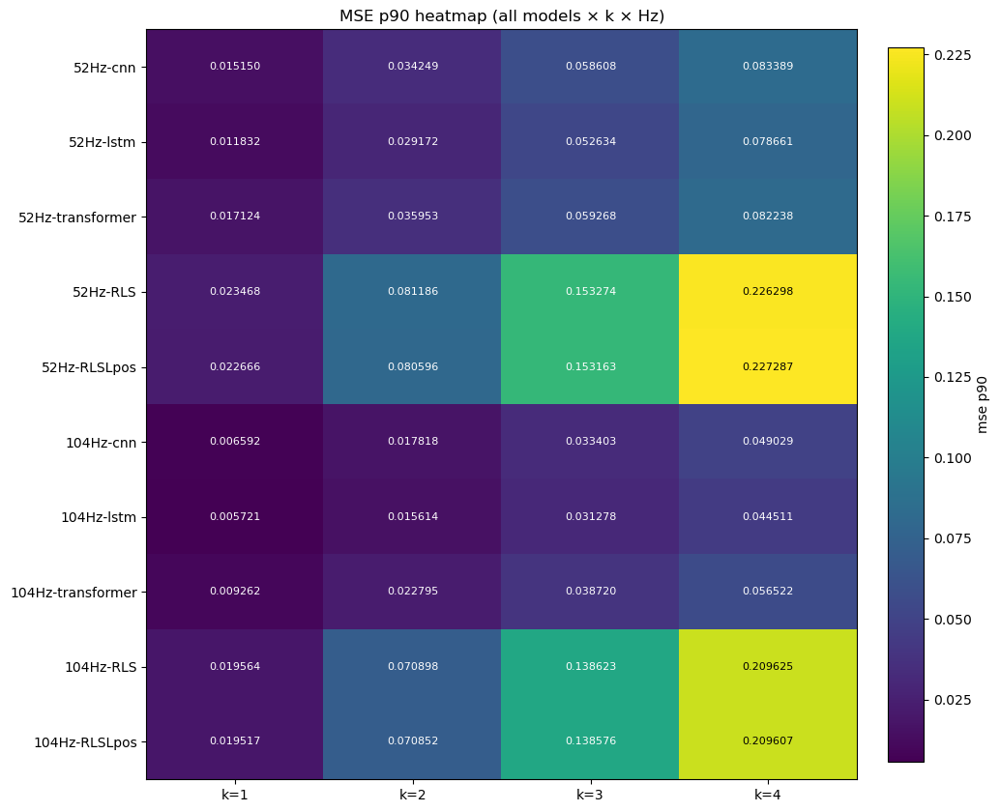

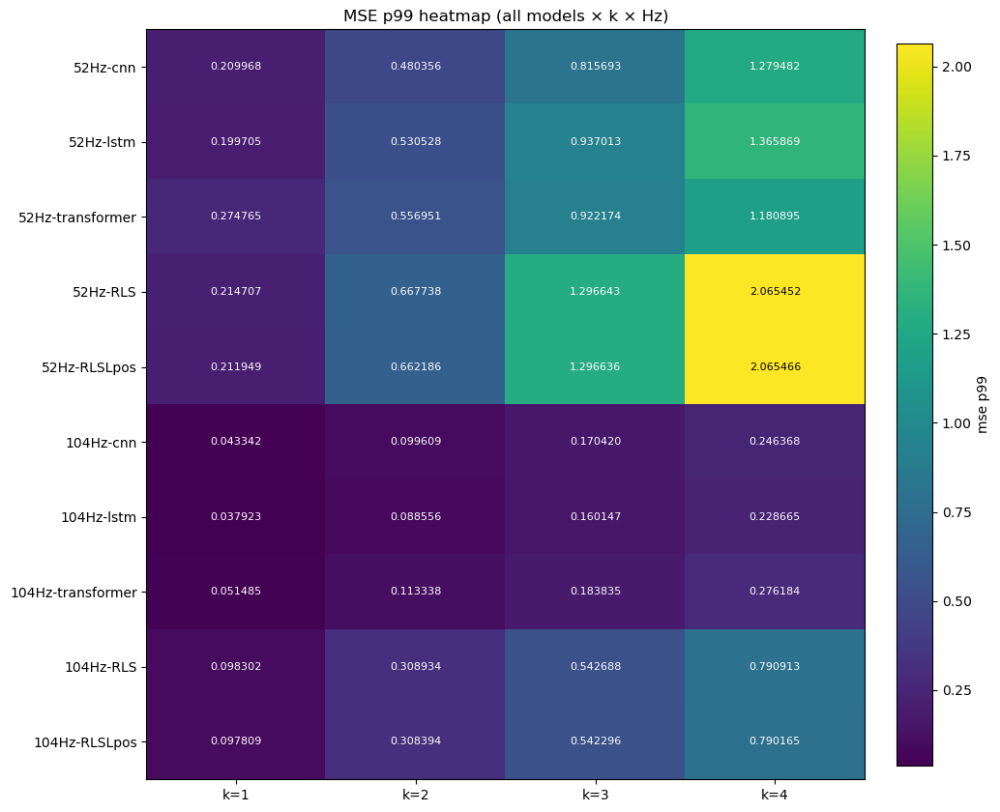

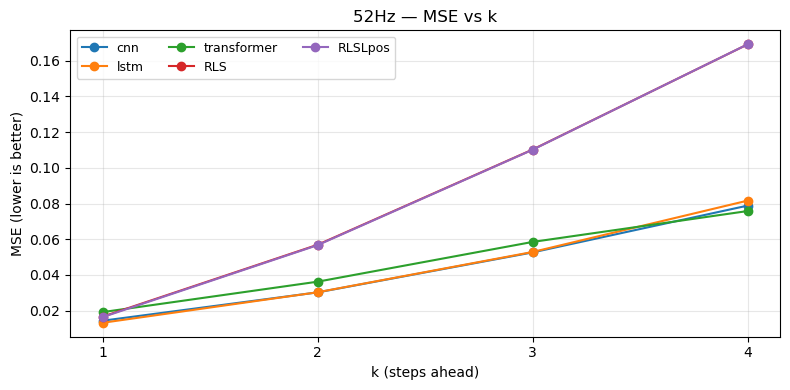

...

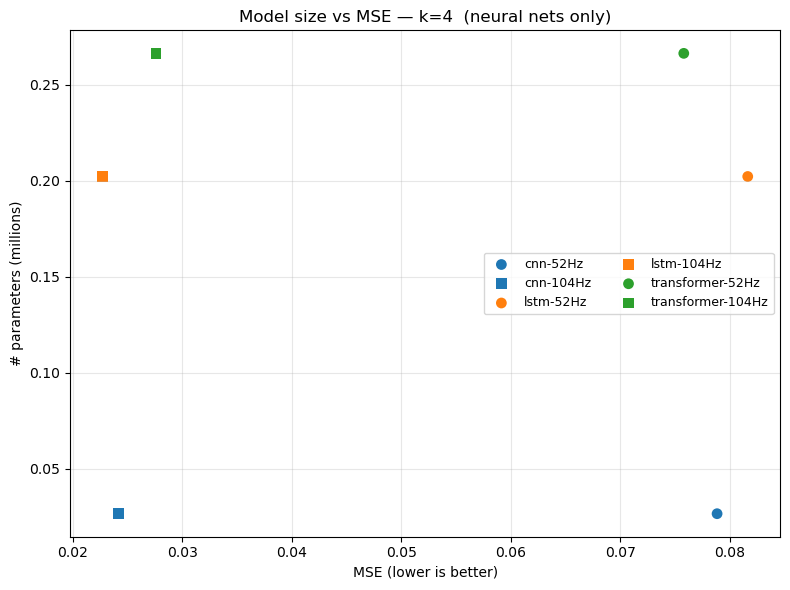

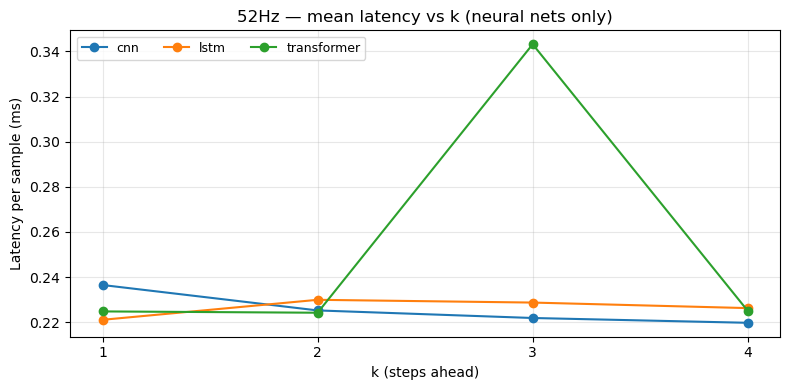

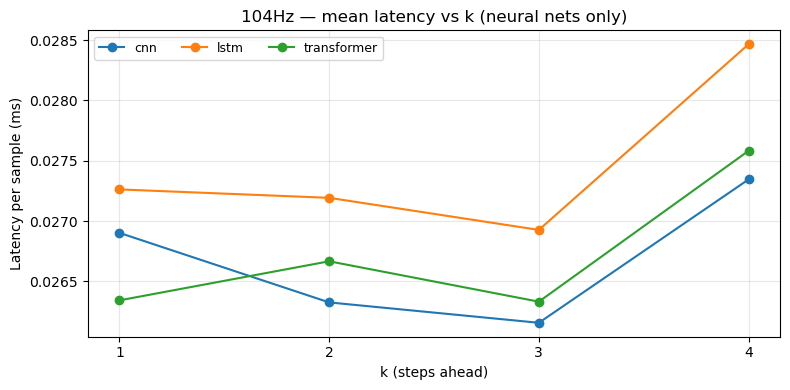

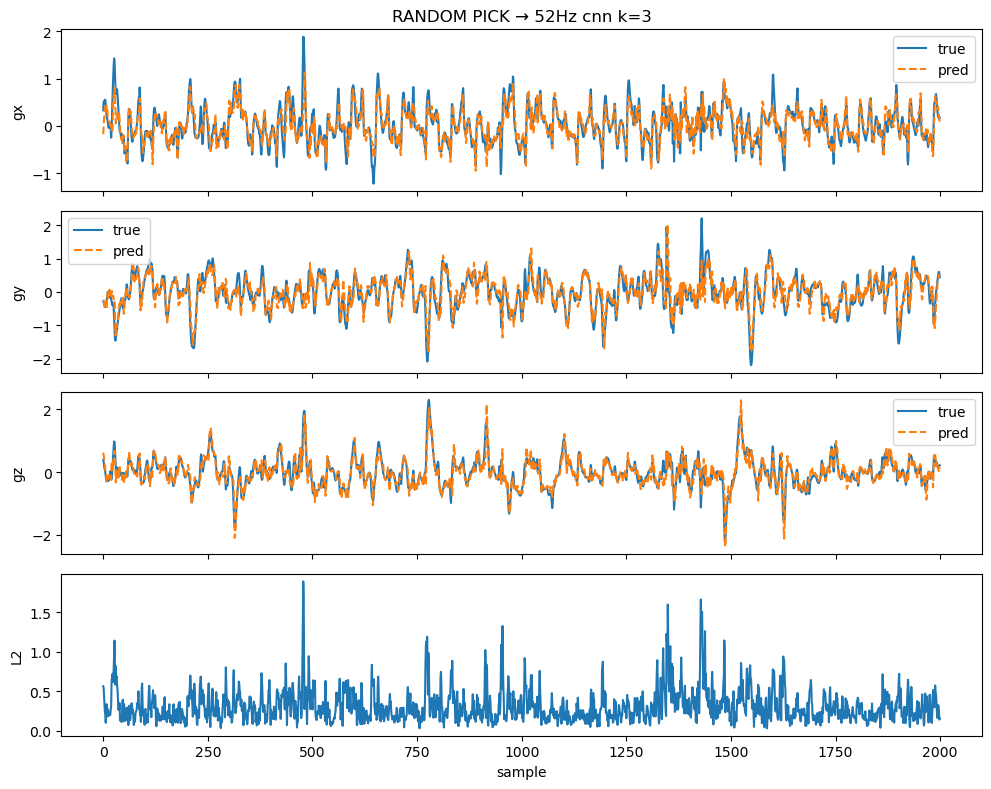

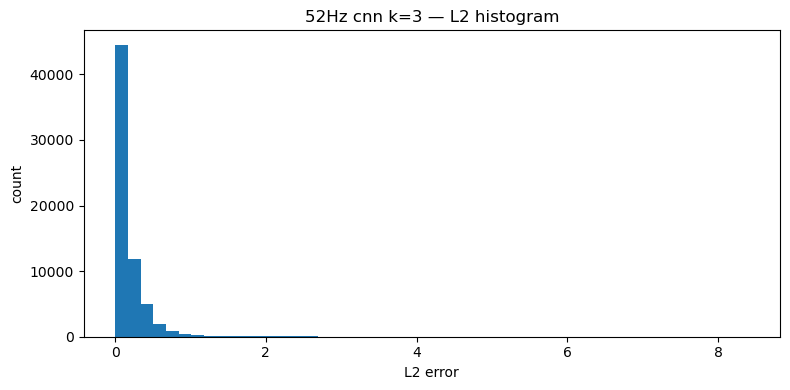

In [8]:
from gyro_predictor.viz.summaries import generate_all_summary_plots

df_summary = generate_all_summary_plots(
    cfg,
    results=results,
    baselines=baselines,
    save_dir=None,            # None -> cfg.artifacts/summaries
    seed=42,
    max_points=2000,
    show=True                 # False to only save files
)

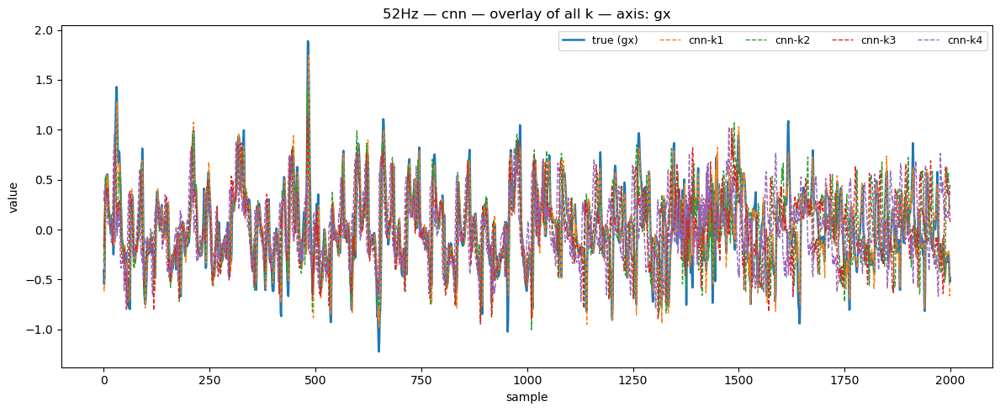

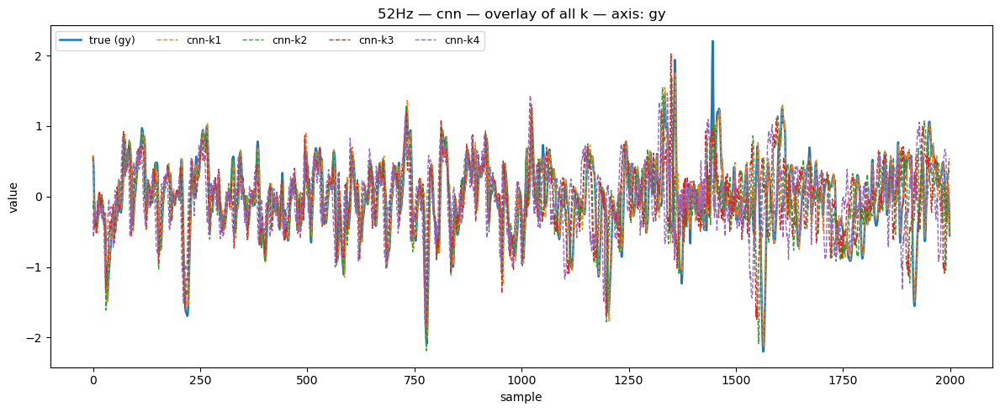

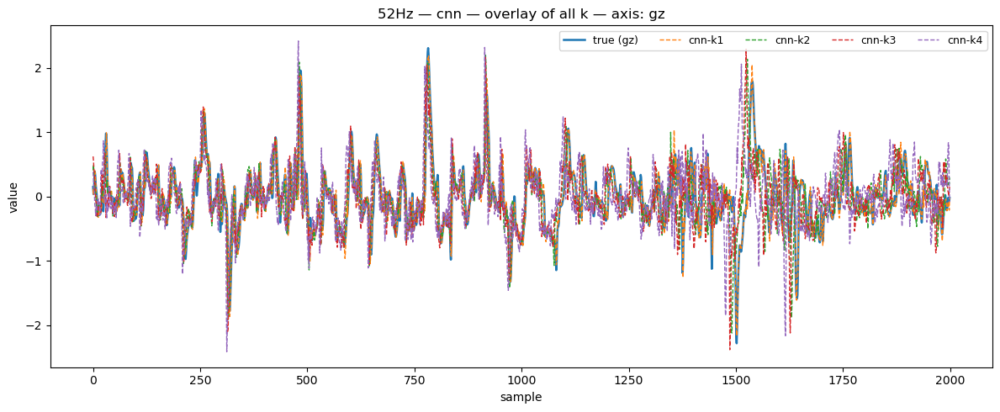

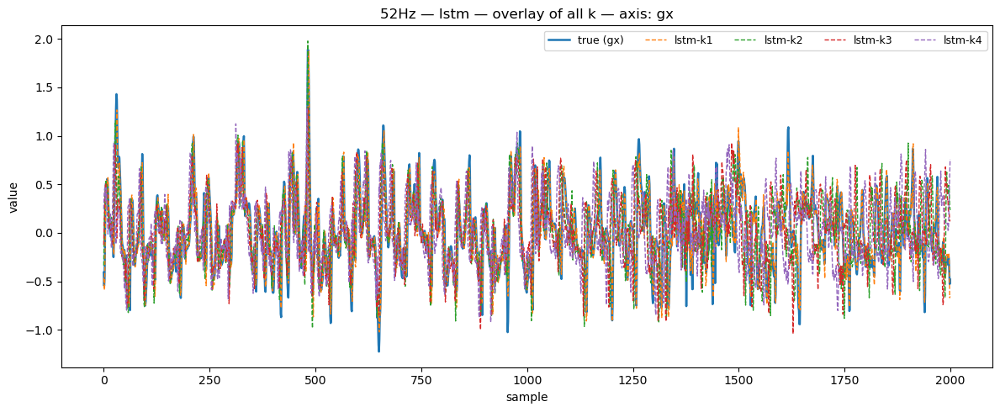

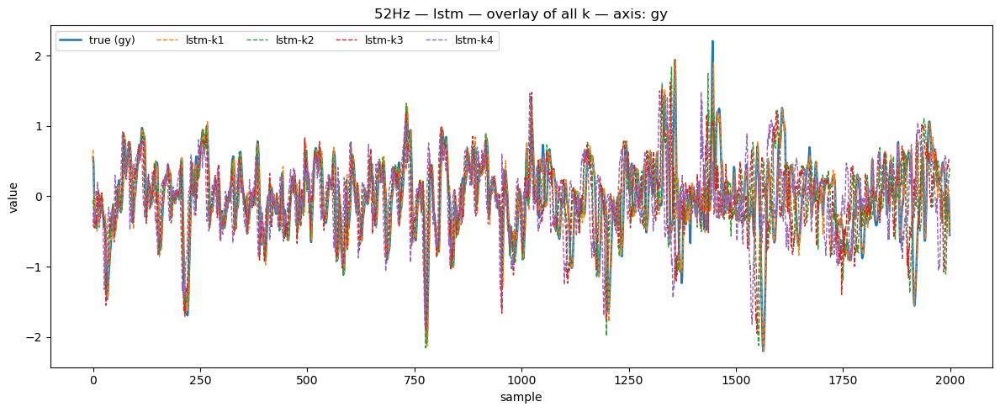

...

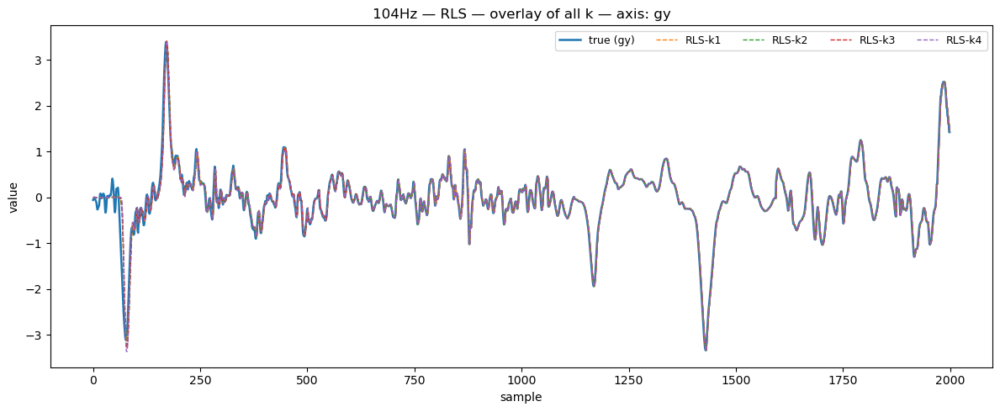

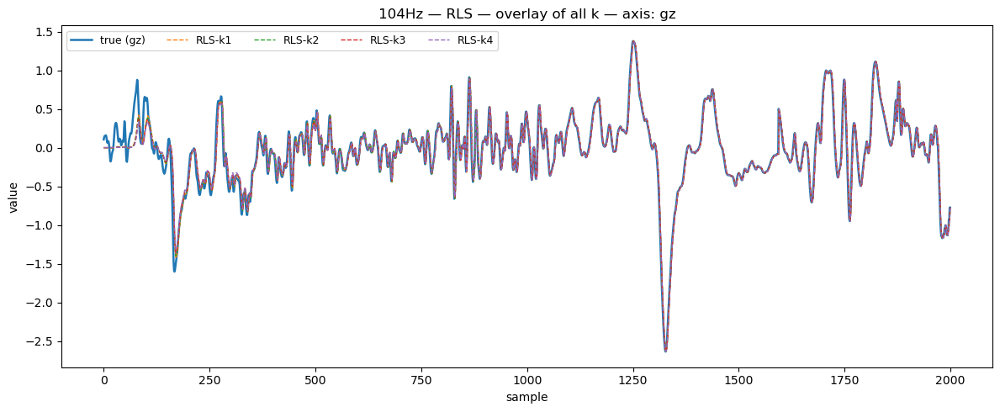

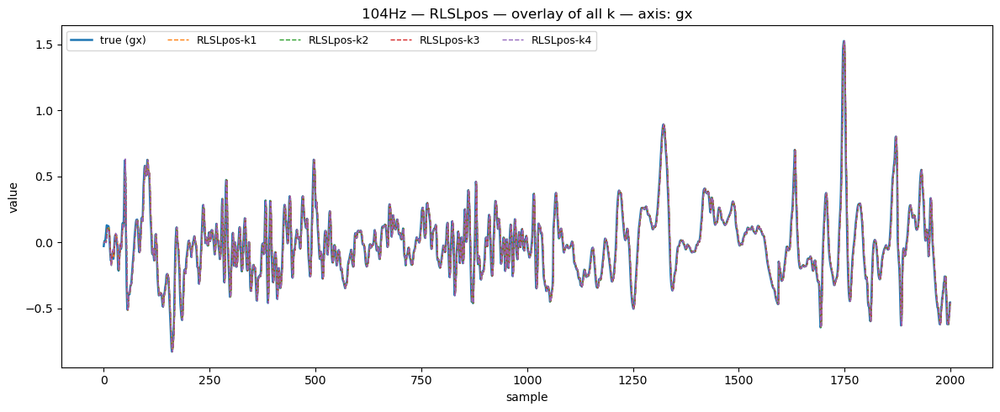

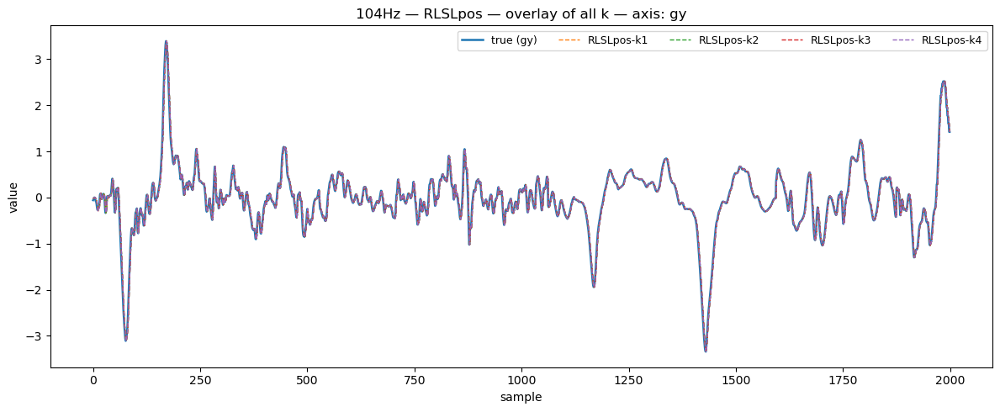

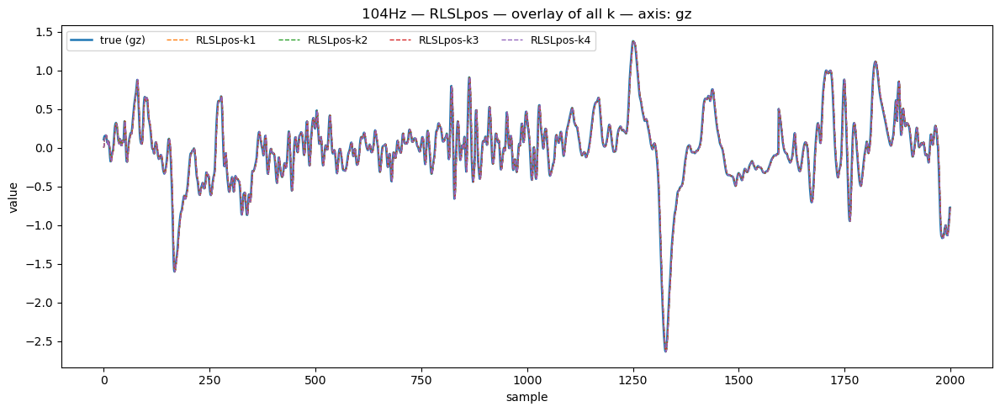

In [9]:
from gyro_predictor.viz.overlays import generate_allk_overlays

generate_allk_overlays(
    cfg,
    results=results,        # NN eval dict
    baselines=baselines,    # from run_rls_baselines(...)
    save_dir=None,          # None -> artifacts/<Hz>Hz/overlays_allk/<family>/
    max_points=2000,
    show=True               # False to only save files
)

[section] Model architecture cards
[model-cards] using in_ch=6 | sample shape=(1, 12, 6)
[model-cards] cnn: layers=12 total_params=26499 -> artifacts\summaries\model_cards\model_arch_cnn.csv
[model-cards] cnn: torch print -> artifacts\summaries\model_cards\model_str_cnn.txt


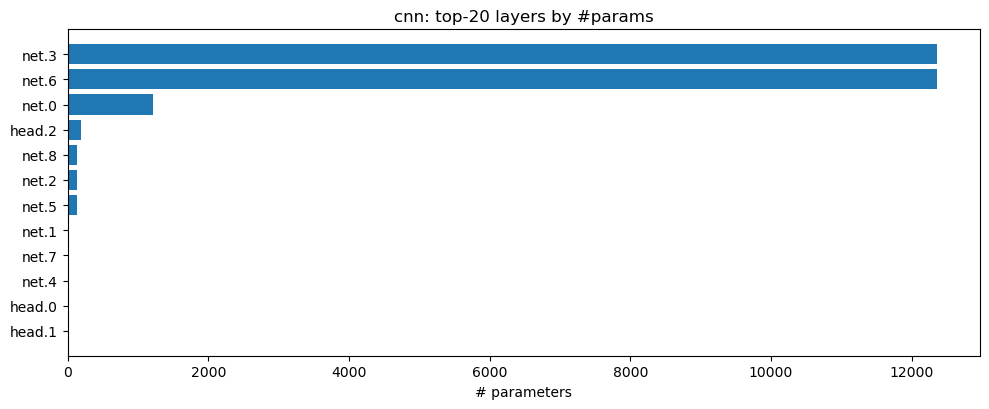

[model-cards] lstm: layers=2 total_params=202115 -> artifacts\summaries\model_cards\model_arch_lstm.csv
[model-cards] lstm: torch print -> artifacts\summaries\model_cards\model_str_lstm.txt


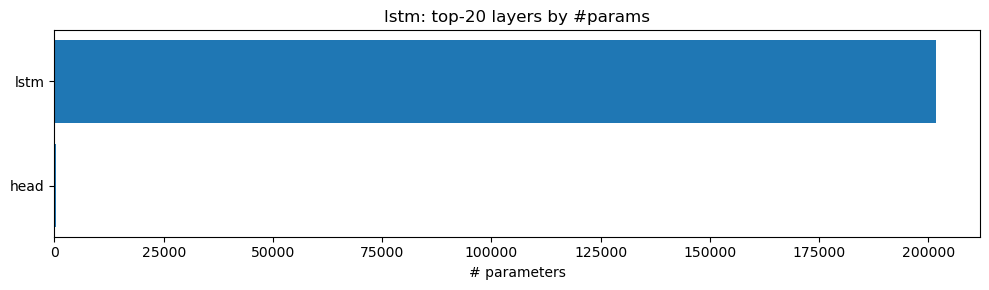

[model-cards] transformer: layers=19 total_params=167171 -> artifacts\summaries\model_cards\model_arch_transformer.csv
[model-cards] transformer: torch print -> artifacts\summaries\model_cards\model_str_transformer.txt


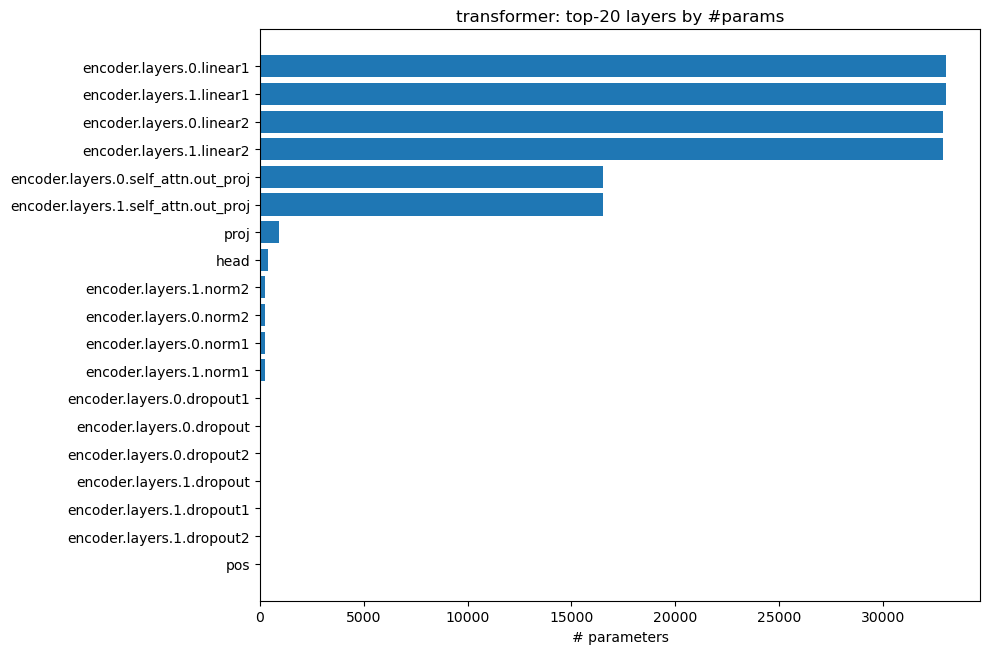

In [10]:
from gyro_predictor.viz.model_card import render_model_summaries, ModelCardConfig

print("[section] Model architecture cards")
_ = render_model_summaries(
    cfg,
    dataset=train_ds,                  # any dataset that returns the right-shaped X
    device=device,
    archs=["cnn","lstm","transformer"],
    save_dir=None,                     # None -> cfg.artifacts/summaries/model_cards
    cfg_mc=ModelCardConfig(
        batch_size=1,
        num_workers=0,                 # keep simple here
        pin_memory=False,
        max_layers_in_bar=20,
        make_bar_plot=True,
        show=True
    )
)


In [11]:
from gyro_predictor.viz.model_table import render_layer_tables, TableCfg

print("[section] Layer tables (sizes/kernels/params)")
tables = render_layer_tables(
    cfg,
    dataset=train_ds,          # any dataset that returns the correct-shaped X
    device=device,
    archs=["cnn","lstm","transformer"],
    save_dir=None,             # -> {cfg.artifacts}/summaries/model_tables
    tcfg=TableCfg(
        batch_size=1,
        num_workers=0,
        pin_memory=False,
        save_csv=True,
        save_md=False,
        show_df=True
    )
)
import pandas as pd
pd.set_option("display.max_colwidth", 80)
tables["cnn"]

[section] Layer tables (sizes/kernels/params)
[model-table] cnn: 12 layers, 26,499 params -> artifacts\summaries\model_tables\cnn_layers.csv
   idx    path name               type out_shape  B   C   T kernel stride  \
0    1   net.0    0             Conv1d   1x64x12  1  64  12      3      1   
1    2   net.1    1               GELU   1x64x12  1  64  12      -      -   
2    3   net.2    2        BatchNorm1d   1x64x12  1  64  12      -      -   
3    4   net.3    3             Conv1d   1x64x12  1  64  12      3      1   
4    5   net.4    4               GELU   1x64x12  1  64  12      -      -   
5    6   net.5    5        BatchNorm1d   1x64x12  1  64  12      -      -   
6    7   net.6    6             Conv1d   1x64x12  1  64  12      3      1   
7    8   net.7    7               GELU   1x64x12  1  64  12      -      -   
8    9   net.8    8        BatchNorm1d   1x64x12  1  64  12      -      -   
9   10  head.0    0  AdaptiveAvgPool1d    1x64x1  1  64   1      -      -   
10  11  head

,idx,path,name,type,out_shape,B,C,T,kernel,stride,activation,params,trainable,notes
0,1,net.0,0,Conv1d,1x64x12,1,64,12,3,1,,1216,True,
1,2,net.1,1,GELU,1x64x12,1,64,12,-,-,GELU,0,False,
2,3,net.2,2,BatchNorm1d,1x64x12,1,64,12,-,-,,128,True,
3,4,net.3,3,Conv1d,1x64x12,1,64,12,3,1,,12352,True,
4,5,net.4,4,GELU,1x64x12,1,64,12,-,-,GELU,0,False,
5,6,net.5,5,BatchNorm1d,1x64x12,1,64,12,-,-,,128,True,
6,7,net.6,6,Conv1d,1x64x12,1,64,12,3,1,,12352,True,
7,8,net.7,7,GELU,1x64x12,1,64,12,-,-,GELU,0,False,
8,9,net.8,8,BatchNorm1d,1x64x12,1,64,12,-,-,,128,True,
9,10,head.0,0,AdaptiveAvgPool1d,1x64x1,1,64,1,-,-,,0,False,


In [12]:
tables["lstm"]

,idx,path,name,type,out_shape,B,C,T,kernel,stride,activation,params,trainable,notes
0,1,lstm,lstm,LSTM,1x12x128,1,12,128,-,-,,201728,True,"hidden=128, layers=2, bidir=False"
1,2,head,head,Linear,1x3,1,3,,-,-,,387,True,"in=128, out=3"
2,(total),,,,,,,,-,-,,202115,True,


In [13]:
tables["transformer"]

,idx,path,name,type,out_shape,B,C,T,kernel,stride,activation,params,trainable,notes
0,1,proj,proj,Linear,1x12x128,1,12,128,-,-,,896,True,"in=6, out=128"
1,2,pos,pos,PositionalEncoding,1x12x128,1,12,128,-,-,,0,False,
2,3,encoder.layers.0.dropout1,dropout1,Dropout,1x12x128,1,12,128,-,-,,0,False,
3,4,encoder.layers.0.norm1,norm1,LayerNorm,1x12x128,1,12,128,-,-,,256,True,
4,5,encoder.layers.0.linear1,linear1,Linear,1x12x256,1,12,256,-,-,,33024,True,"in=128, out=256"
5,6,encoder.layers.0.dropout,dropout,Dropout,1x12x256,1,12,256,-,-,,0,False,
6,7,encoder.layers.0.linear2,linear2,Linear,1x12x128,1,12,128,-,-,,32896,True,"in=256, out=128"
7,8,encoder.layers.0.dropout2,dropout2,Dropout,1x12x128,1,12,128,-,-,,0,False,
8,9,encoder.layers.0.norm2,norm2,LayerNorm,1x12x128,1,12,128,-,-,,256,True,
9,10,encoder.layers.1.dropout1,dropout1,Dropout,1x12x128,1,12,128,-,-,,0,False,
